In [2]:
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from sklearn.metrics import mean_squared_error, mean_absolute_error

In [3]:
proj_dir = Path("..") / "Data/r77-mini-data-fortnight"
print(proj_dir.joinpath("input"))

data_dir = proj_dir
input_dir = data_dir.joinpath("input")
fixed_input_dir = input_dir.joinpath("fixed")
temporal_input_dir = input_dir.joinpath("temporal")
target_dir = data_dir.joinpath("target")
fixed_target_dir = target_dir.joinpath("fixed")
temporal_target_dir = target_dir.joinpath("temporal")

../Data/r77-mini-data-fortnight/input


In [4]:
files = list(temporal_target_dir.iterdir())


index_dir = Path("..")/"Index"
files_index = list(index_dir.iterdir())
indices = np.load(files_index[0]).squeeze()

#First hour of data
index = indices[0]
tt = np.load(files[index]).squeeze()
tt.shape

(144, 70, 100, 3)

In [5]:
files_ti = list(temporal_input_dir.iterdir())

In [6]:
#all diff data
data = []

for j in range(360):
    index = indices[j]

    tt = np.load(files[index]).squeeze()
    tt = np.transpose(tt, (0, 2, 3, 1))[:, :, :, :64]  #shape: (144, 100, 3, 64)

    ti = np.load(files_ti[index]).squeeze()
    ti = np.transpose(ti, (0, 2, 1))[:, :, :64]  #shape: (144, 3, 64)

    #ensure ti has the same second dimension as tt
    ti_expanded = np.repeat(ti[:, None, :, :], tt.shape[1], axis=1)  #shape: (144, 100, 3, 64)

    #calculate diff and reshape
    diff_data = tt - ti_expanded  #shape: (144, 100, 3, 64)
    reshaped_tt = diff_data.reshape(-1, 3, 64)  #shape: (14400, 3, 64)

    data.append(reshaped_tt)


data = np.concatenate(data).reshape(-1, 3, 64)
data.shape

(5184000, 3, 64)

In [7]:
def normalise(vector):
    min_val = np.min(vector)
    max_val = np.max(vector)
    normalised_vector = (vector - min_val) / (max_val - min_val)
    return normalised_vector, min_val, max_val

In [8]:
training_data = normalise(data)[0]
min_val = normalise(data)[1]
max_val = normalise(data)[2]

In [9]:
files_fixed = list(fixed_input_dir.iterdir())
files_ft = list(fixed_target_dir.iterdir())
#std dev calculated for each grid using fxed target vectors, combined with fixed input vector to give three fixed variables for each grid
#fixed variables all (fixed input repeated 100 times for each grid)

cond = []

for j in range(360):
    index = indices[j]
    fi = np.load(files_fixed[index]).squeeze()
    ft = np.load(files_ft[index]).squeeze()

    stdev_orog = np.array([np.std(i) for i in ft]).reshape(-1,1)
    fixed_input = np.hstack((fi, stdev_orog))
    reshaped_fi = np.repeat(fixed_input, 100, axis=0)
    cond.append(reshaped_fi)


cond = np.concatenate(cond).reshape(-1, 3)
cond.shape

(5184000, 3)

In [10]:
lsf = cond[:,0]
orog = cond[:,1]
stdev_orog = cond[:,2]

In [11]:
#all data
tt_all = np.stack([
    np.transpose(np.load(files[indices[i]]).squeeze(), (0, 2, 3, 1))[:,:,:,:64].reshape((14400, 3, 64), order = 'C')
    for i in range(360)
])

all_data = tt_all.reshape(-1,3,64)
all_data.shape

(5184000, 3, 64)

In [12]:
#has inversion
def has_inversion(temperature_profile, troposphere_height):
    gradient = np.gradient(temperature_profile[:troposphere_height])
    return np.any(np.array(gradient) > 0.0)

temp = all_data[:,2,:]

inversion = np.array([has_inversion(i, 40) for i in temp])
inversion[inversion == False].shape[0]

1220648

In [13]:
indices1 = np.where((inversion == False))[0]
data1 = data[indices1]

indices2 = np.where((inversion == True))[0]
data2 = data[indices2]

print(f'no inversion training data {data1.shape}')
print(f'has inversion training data {data2.shape}')

no inversion training data (1220648, 3, 64)
has inversion training data (3963352, 3, 64)


In [14]:
indices1 = np.where((inversion == False) & (lsf == 0))[0]
training_data1 =data[indices1]

indices2 = np.where((inversion == False) & (lsf == 1) & (orog < 0.06))[0]
training_data2 = data[indices2]

indices3 = np.where((inversion == False) & (lsf == 1) & (orog > 0.06))[0]
training_data3 = data[indices3]

indices4 = np.where((inversion == False) & (lsf < 1) & (lsf > 0) & (orog < 0.03))[0]
training_data4 = data[indices4]

indices5 = np.where((inversion == False) & (lsf < 1) & (lsf > 0) & (orog > 0.03))[0]
training_data5 = data[indices5]

indices6 = np.where((inversion == True) & (lsf == 0))[0]
training_data6 = data[indices6]

indices7 = np.where((inversion == True) & (lsf == 1) & (orog < 0.06))[0]
training_data7 = data[indices7]

indices8 = np.where((inversion == True) & (lsf == 1) & (orog > 0.06))[0]
training_data8 = data[indices8]

indices9 = np.where((inversion == True) & (lsf < 1) & (lsf > 0) & (orog < 0.03))[0]
training_data9 = data[indices9]

indices10 = np.where((inversion == True) & (lsf < 1) & (lsf > 0) & (orog > 0.03))[0]
training_data10 = data[indices10]

In [15]:
random_indices1 = np.random.choice(training_data1.shape[0], 1000, replace=False)
trainingdata1 = training_data1[random_indices1]

random_indices2 = np.random.choice(training_data2.shape[0], 1000, replace=False)
trainingdata2 = training_data2[random_indices2]

random_indices3 = np.random.choice(training_data3.shape[0], 1000, replace=False)
trainingdata3 = training_data3[random_indices3]

random_indices4 = np.random.choice(training_data4.shape[0], 1000, replace=False)
trainingdata4 = training_data4[random_indices4]

random_indices5 = np.random.choice(training_data5.shape[0], 1000, replace=False)
trainingdata5 = training_data5[random_indices5]

random_indices6 = np.random.choice(training_data6.shape[0], 1000, replace=False)
trainingdata6 = training_data6[random_indices6]

random_indices7 = np.random.choice(training_data7.shape[0], 1000, replace=False)
trainingdata7 = training_data7[random_indices7]

random_indices8 = np.random.choice(training_data8.shape[0], 1000, replace=False)
trainingdata8 = training_data8[random_indices8]

random_indices9 = np.random.choice(training_data9.shape[0], 1000, replace=False)
trainingdata9 = training_data9[random_indices9]

random_indices10 = np.random.choice(training_data10.shape[0], 1000, replace=False)
trainingdata10 = training_data10[random_indices10]

In [16]:
sample_diff_dir = Path("Samples_cond_diffs_2")
files_sample_diff = list(sample_diff_dir.iterdir())

sample_diffs = np.load(files_sample_diff[0]).squeeze()
sample_diffs.shape

(10, 1000, 3, 64)

In [17]:
def denormalise(normalised_vector, min_val, max_val):
    original_vector = normalised_vector * (max_val - min_val) + min_val
    return original_vector

samples = denormalise(sample_diffs, min_val, max_val)

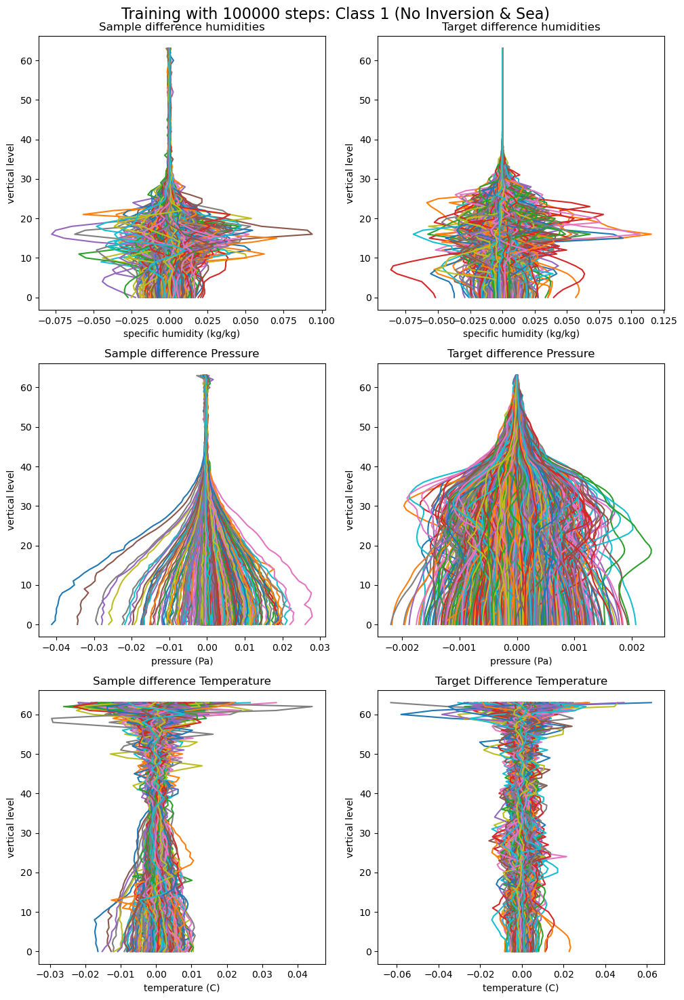

In [18]:
fig, axs = plt.subplots(3, 2, figsize=(10, 15))

#Sample humidities plot
sample_humidity = samples[0, :, 0, :]
for i in range(1000):
    axs[0,0].plot(sample_humidity[i], np.arange(64))
axs[0,0].set_xlabel("specific humidity (kg/kg)")
axs[0,0].set_ylabel("vertical level")
axs[0,0].set_title("Sample difference humidities")


# Target humidities plot
target_humidity = trainingdata1[:, 0, :] 
for i in range(1000):
    axs[0,1].plot(target_humidity[i], np.arange(64))
axs[0,1].set_xlabel("specific humidity (kg/kg)")
axs[0,1].set_ylabel("vertical level")
axs[0,1].set_title("Target difference humidities")

#Sample pressure plot
sample_pressure = samples[0, :, 1, :] 
for i in range(1000):
    axs[1,0].plot(sample_pressure[i], np.arange(64))
axs[1,0].set_xlabel("pressure (Pa)")
axs[1,0].set_ylabel("vertical level")
axs[1,0].set_title("Sample difference Pressure")

# Target pressure plot
target_pressure = trainingdata1[:, 1, :] 
for i in range(1000):
    axs[1,1].plot(target_pressure[i], np.arange(64))
axs[1,1].set_xlabel("pressure (Pa)")
axs[1,1].set_ylabel("vertical level")
axs[1,1].set_title("Target difference Pressure")

#Sample temperature plot
sample_temperature = samples[0, :, 2, :]
for i in range(1000):
    axs[2,0].plot(sample_temperature[i], np.arange(64))
axs[2,0].set_xlabel("temperature (C)")
axs[2,0].set_ylabel("vertical level")
axs[2,0].set_title("Sample difference Temperature")

# Target pressure plot
target_temperature = trainingdata1[:, 2, :]
for i in range(1000):
    axs[2,1].plot(target_temperature[i], np.arange(64))
axs[2,1].set_xlabel("temperature (C)")
axs[2,1].set_ylabel("vertical level")
axs[2,1].set_title("Target Difference Temperature")

fig.suptitle("Training with 100000 steps: Class 1 (No Inversion & Sea)", fontsize = 16)

plt.tight_layout()
plt.show()

In [47]:
#humid
target_mean_1h = np.mean(training_data1[:,0,:], axis= 0)
sample_mean_1h = np.mean(sample_humidity, axis=0)
target_variance_1h= np.var(training_data1[:,0,:], axis= 0)
sample_variance_1h = np.var(sample_humidity, axis=0)

mse_mean_1h = mean_squared_error(target_mean_1h, sample_mean_1h)
mse_variance_1h = mean_squared_error(target_variance_1h, sample_variance_1h)

#press
target_mean_1p = np.mean(training_data1[:,1,:], axis= 0)
sample_mean_1p = np.mean(sample_pressure, axis=0)
target_variance_1p= np.var(training_data1[:,1,:], axis= 0)
sample_variance_1p = np.var(sample_pressure, axis=0)

mse_mean_1p = mean_squared_error(target_mean_1p, sample_mean_1p)
mse_variance_1p = mean_squared_error(target_variance_1p, sample_variance_1p)

#temp
target_mean_1t = np.mean(training_data1[:,2,:], axis= 0)
sample_mean_1t = np.mean(sample_pressure, axis=0)
target_variance_1t= np.var(training_data1[:,2,:], axis= 0)
sample_variance_1t = np.var(sample_pressure, axis=0)

mse_mean_1t = mean_squared_error(target_mean_1t, sample_mean_1t)
mse_variance_1t = mean_squared_error(target_variance_1t, sample_variance_1t)

#results
print('Results for Class 1 (No Temperature Inversion & Sea)')
print(f"Humidity, MSE Mean: {mse_mean_1h}, MSE Variance: {mse_variance_1h}, target_mean: {np.mean(target_mean_1h)}, target_variance: {np.mean(np.sqrt(target_variance_1h))} ")
print(f"Pressure, MSE Mean: {mse_mean_1p}, MSE Variance: {mse_variance_1p}, target_mean: {np.mean(target_mean_1p)}, target_variance: {np.mean(np.sqrt(target_variance_1p))}")
print(f"Temperature, MSE Mean: {mse_mean_1t}, MSE Variance: {mse_variance_1t}, target_mean: {np.mean(target_mean_1t)}, target_variance: {np.mean(np.sqrt(target_variance_1t))} ")

Results for Class 1 (No Temperature Inversion & Sea)
Humidity, MSE Mean: 1.388760756526608e-05, MSE Variance: 6.833136279027485e-10, target_mean: 0.0001017086542560719, target_variance: 0.0037843056488782167 
Pressure, MSE Mean: 7.846997505112085e-07, MSE Variance: 1.5453316404290263e-10, target_mean: -6.1836285567551386e-06, target_variance: 0.00037715263897553086
Temperature, MSE Mean: 8.249550091932178e-07, MSE Variance: 1.460284670962153e-10, target_mean: 4.162683580943849e-06, target_variance: 0.0023345001973211765 


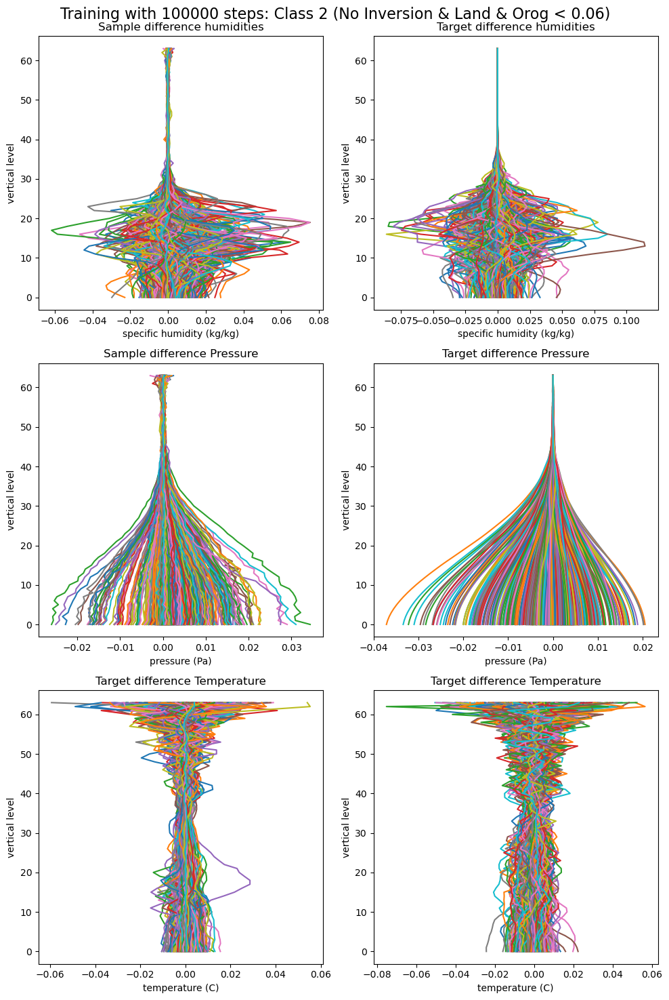

In [20]:

fig, axs = plt.subplots(3, 2, figsize=(10, 15))

#Sample humidities plot
sample_humidity = samples[1, :, 0, :]
for i in range(1000):
    axs[0,0].plot(sample_humidity[i], np.arange(64))
axs[0,0].set_xlabel("specific humidity (kg/kg)")
axs[0,0].set_ylabel("vertical level")
axs[0,0].set_title("Sample difference humidities")


# Target humidities plot
target_humidity = trainingdata2[:, 0, :] 
for i in range(1000):
    axs[0,1].plot(target_humidity[i], np.arange(64))
axs[0,1].set_xlabel("specific humidity (kg/kg)")
axs[0,1].set_ylabel("vertical level")
axs[0,1].set_title("Target difference humidities")

#Sample pressure plot
sample_pressure = samples[1, :, 1, :] 
for i in range(1000):
    axs[1,0].plot(sample_pressure[i], np.arange(64))
axs[1,0].set_xlabel("pressure (Pa)")
axs[1,0].set_ylabel("vertical level")
axs[1,0].set_title("Sample difference Pressure")

# Target pressure plot
target_pressure = trainingdata2[:, 1, :] 
for i in range(1000):
    axs[1,1].plot(target_pressure[i], np.arange(64))
axs[1,1].set_xlabel("pressure (Pa)")
axs[1,1].set_ylabel("vertical level")
axs[1,1].set_title("Target difference Pressure")

#Sample temperature plot
sample_temperature = samples[1, :, 2, :]
for i in range(1000):
    axs[2,0].plot(sample_temperature[i], np.arange(64))
axs[2,0].set_xlabel("temperature (C)")
axs[2,0].set_ylabel("vertical level")
axs[2,0].set_title("Target difference Temperature")

# Target pressure plot
target_temperature = trainingdata2[:, 2, :]
for i in range(1000):
    axs[2,1].plot(target_temperature[i], np.arange(64))
axs[2,1].set_xlabel("temperature (C)")
axs[2,1].set_ylabel("vertical level")
axs[2,1].set_title("Target difference Temperature")

fig.suptitle("Training with 100000 steps: Class 2 (No Inversion & Land & Orog < 0.06)", fontsize = 16)

plt.tight_layout()
plt.show()

In [21]:
#humid
target_mean_1h = np.mean(training_data2[:,0,:], axis= 0)
sample_mean_1h = np.mean(sample_humidity, axis=0)
target_variance_1h= np.var(training_data1[:,0,:], axis= 0)
sample_variance_1h = np.var(sample_humidity, axis=0)

mse_mean_1h = mean_squared_error(target_mean_1h, sample_mean_1h)
mse_variance_1h = mean_squared_error(target_variance_1h, sample_variance_1h)

#press
target_mean_1p = np.mean(training_data2[:,1,:], axis= 0)
sample_mean_1p = np.mean(sample_pressure, axis=0)
target_variance_1p= np.var(training_data2[:,1,:], axis= 0)
sample_variance_1p = np.var(sample_pressure, axis=0)

mse_mean_1p = mean_squared_error(target_mean_1p, sample_mean_1p)
mse_variance_1p = mean_squared_error(target_variance_1p, sample_variance_1p)

#temp
target_mean_1t = np.mean(training_data2[:,2,:], axis= 0)
sample_mean_1t = np.mean(sample_pressure, axis=0)
target_variance_1t= np.var(training_data2[:,2,:], axis= 0)
sample_variance_1t = np.var(sample_pressure, axis=0)

mse_mean_1t = mean_squared_error(target_mean_1t, sample_mean_1t)
mse_variance_1t = mean_squared_error(target_variance_1t, sample_variance_1t)

#results
print('Results for Class 2 (No Inversion & Land & Orog < 0.06)')
print(f"Humidity, MSE Mean: {mse_mean_1h}, MSE Variance: {mse_variance_1h}, target_mean: {np.mean(target_mean_1h)} ")
print(f"Pressure, MSE Mean: {mse_mean_1p}, MSE Variance: {mse_variance_1p}, target_mean: {np.mean(target_mean_1p)} ")
print(f"Temperature, MSE Mean: {mse_mean_1t}, MSE Variance: {mse_variance_1t}, target_mean: {np.mean(target_mean_1t)} ")

Results for Class 2 (No Inversion & Land & Orog < 0.06)
Humidity, MSE Mean: 1.13104579213541e-06, MSE Variance: 1.3725905134709393e-10, target_mean: 0.00011148552584927529 
Pressure, MSE Mean: 1.2740988495352212e-06, MSE Variance: 1.8071109886275138e-10, target_mean: -3.732338655026979e-06 
Temperature, MSE Mean: 1.2822599728679052e-06, MSE Variance: 8.878138224588383e-10, target_mean: -6.516884241136722e-06 


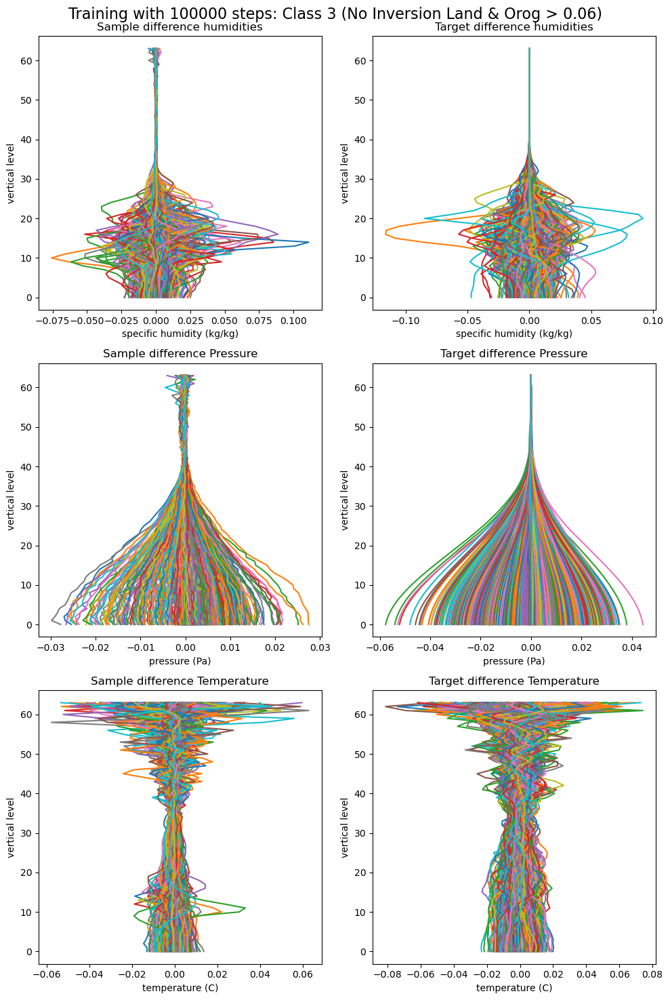

In [22]:
fig, axs = plt.subplots(3, 2, figsize=(10, 15))

#Sample humidities plot
sample_humidity = samples[2, :, 0, :] 
for i in range(1000):
    axs[0,0].plot(sample_humidity[i], np.arange(64))
axs[0,0].set_xlabel("specific humidity (kg/kg)")
axs[0,0].set_ylabel("vertical level")
axs[0,0].set_title("Sample difference humidities")


# Target humidities plot
target_humidity = trainingdata3[:, 0, :]
for i in range(1000):
    axs[0,1].plot(target_humidity[i], np.arange(64))
axs[0,1].set_xlabel("specific humidity (kg/kg)")
axs[0,1].set_ylabel("vertical level")
axs[0,1].set_title("Target difference humidities")

#Sample pressure plot
sample_pressure = samples[2, :, 1, :] 
for i in range(1000):
    axs[1,0].plot(sample_pressure[i], np.arange(64))
axs[1,0].set_xlabel("pressure (Pa)")
axs[1,0].set_ylabel("vertical level")
axs[1,0].set_title("Sample difference Pressure")

# Target pressure plot
target_pressure = trainingdata3[:, 1, :]
for i in range(1000):
    axs[1,1].plot(target_pressure[i], np.arange(64))
axs[1,1].set_xlabel("pressure (Pa)")
axs[1,1].set_ylabel("vertical level")
axs[1,1].set_title("Target difference Pressure")

#Sample temperature plot
sample_temperature = samples[2, :, 2, :]
for i in range(1000):
    axs[2,0].plot(sample_temperature[i], np.arange(64))
axs[2,0].set_xlabel("temperature (C)")
axs[2,0].set_ylabel("vertical level")
axs[2,0].set_title("Sample difference Temperature")

# Target pressure plot
target_temperature = trainingdata3[:, 2, :]
for i in range(1000):
    axs[2,1].plot(target_temperature[i], np.arange(64))
axs[2,1].set_xlabel("temperature (C)")
axs[2,1].set_ylabel("vertical level")
axs[2,1].set_title("Target difference Temperature")

fig.suptitle("Training with 100000 steps: Class 3 (No Inversion Land & Orog > 0.06)", fontsize = 16)

plt.tight_layout()
plt.show()

In [23]:
#humid
target_mean_1h = np.mean(training_data3[:,0,:], axis= 0)
sample_mean_1h = np.mean(sample_humidity, axis=0)
target_variance_1h= np.var(training_data3[:,0,:], axis= 0)
sample_variance_1h = np.var(sample_humidity, axis=0)

mse_mean_1h = mean_squared_error(target_mean_1h, sample_mean_1h)
mse_variance_1h = mean_squared_error(target_variance_1h, sample_variance_1h)

#press
target_mean_1p = np.mean(training_data3[:,1,:], axis= 0)
sample_mean_1p = np.mean(sample_pressure, axis=0)
target_variance_1p= np.var(training_data3[:,1,:], axis= 0)
sample_variance_1p = np.var(sample_pressure, axis=0)

mse_mean_1p = mean_squared_error(target_mean_1p, sample_mean_1p)
mse_variance_1p = mean_squared_error(target_variance_1p, sample_variance_1p)

#temp
target_mean_1t = np.mean(training_data3[:,2,:], axis= 0)
sample_mean_1t = np.mean(sample_pressure, axis=0)
target_variance_1t= np.var(training_data3[:,2,:], axis= 0)
sample_variance_1t = np.var(sample_pressure, axis=0)

mse_mean_1t = mean_squared_error(target_mean_1t, sample_mean_1t)
mse_variance_1t = mean_squared_error(target_variance_1t, sample_variance_1t)

#results
print('Results for Class 3 (No Inversion & Land & Orog > 0.06)')
print(f"Humidity, MSE Mean: {mse_mean_1h}, MSE Variance: {mse_variance_1h}, target_mean: {np.mean(target_mean_1h)} ")
print(f"Pressure, MSE Mean: {mse_mean_1p}, MSE Variance: {mse_variance_1p}, target_mean: {np.mean(target_mean_1p)} ")
print(f"Temperature, MSE Mean: {mse_mean_1t}, MSE Variance: {mse_variance_1t}, target_mean: {np.mean(target_mean_1t)} ")

Results for Class 3 (No Inversion & Land & Orog > 0.06)
Humidity, MSE Mean: 1.1180677006450424e-07, MSE Variance: 6.085157377988537e-10, target_mean: 9.55105060711503e-05 
Pressure, MSE Mean: 1.5670792663513566e-07, MSE Variance: 1.1149940526422597e-08, target_mean: 8.402342791669071e-05 
Temperature, MSE Mean: 2.7043137151849805e-07, MSE Variance: 3.853034336032124e-09, target_mean: 1.0481673598405905e-05 


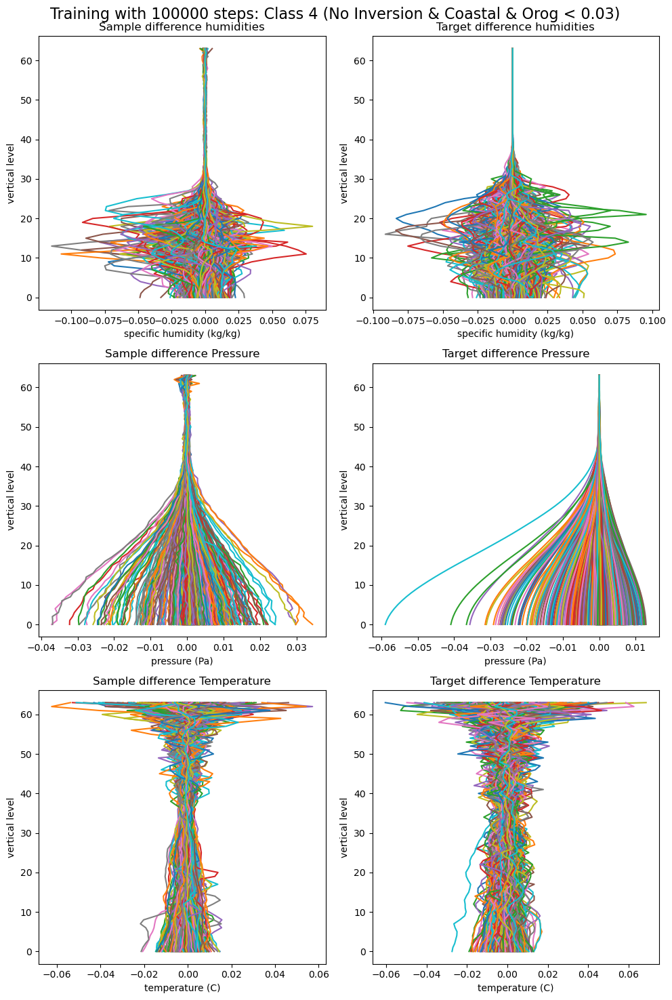

In [24]:
fig, axs = plt.subplots(3, 2, figsize=(10, 15))

#Sample humidities plot
sample_humidity = samples[3, :, 0, :] 
for i in range(1000):
    axs[0,0].plot(sample_humidity[i], np.arange(64))
axs[0,0].set_xlabel("specific humidity (kg/kg)")
axs[0,0].set_ylabel("vertical level")
axs[0,0].set_title("Sample difference humidities")


# Target humidities plot
target_humidity = trainingdata4[:, 0, :] 
for i in range(1000):
    axs[0,1].plot(target_humidity[i], np.arange(64))
axs[0,1].set_xlabel("specific humidity (kg/kg)")
axs[0,1].set_ylabel("vertical level")
axs[0,1].set_title("Target difference humidities")

#Sample pressure plot
sample_pressure = samples[3, :, 1, :]
for i in range(1000):
    axs[1,0].plot(sample_pressure[i], np.arange(64))
axs[1,0].set_xlabel("pressure (Pa)")
axs[1,0].set_ylabel("vertical level")
axs[1,0].set_title("Sample difference Pressure")

# Target pressure plot
target_pressure = trainingdata4[:, 1, :] 
for i in range(1000):
    axs[1,1].plot(target_pressure[i], np.arange(64))
axs[1,1].set_xlabel("pressure (Pa)")
axs[1,1].set_ylabel("vertical level")
axs[1,1].set_title("Target difference Pressure")

#Sample temperature plot
sample_temperature = samples[3, :, 2, :]
for i in range(1000):
    axs[2,0].plot(sample_temperature[i], np.arange(64))
axs[2,0].set_xlabel("temperature (C)")
axs[2,0].set_ylabel("vertical level")
axs[2,0].set_title("Sample difference Temperature")

# Target pressure plot
target_temperature = trainingdata4[:, 2, :]
for i in range(1000):
    axs[2,1].plot(target_temperature[i], np.arange(64))
axs[2,1].set_xlabel("temperature (C)")
axs[2,1].set_ylabel("vertical level")
axs[2,1].set_title("Target difference Temperature")

fig.suptitle("Training with 100000 steps: Class 4 (No Inversion & Coastal & Orog < 0.03)", fontsize = 16)

plt.tight_layout()
plt.show()

In [25]:
#humid
target_mean_1h = np.mean(training_data4[:,0,:], axis= 0)
sample_mean_1h = np.mean(sample_humidity, axis=0)
target_variance_1h= np.var(training_data4[:,0,:], axis= 0)
sample_variance_1h = np.var(sample_humidity, axis=0)

mse_mean_1h = mean_squared_error(target_mean_1h, sample_mean_1h)
mse_variance_1h = mean_squared_error(target_variance_1h, sample_variance_1h)

#press
target_mean_1p = np.mean(training_data4[:,1,:], axis= 0)
sample_mean_1p = np.mean(sample_pressure, axis=0)
target_variance_1p= np.var(training_data4[:,1,:], axis= 0)
sample_variance_1p = np.var(sample_pressure, axis=0)

mse_mean_1p = mean_squared_error(target_mean_1p, sample_mean_1p)
mse_variance_1p = mean_squared_error(target_variance_1p, sample_variance_1p)

#temp
target_mean_1t = np.mean(training_data4[:,2,:], axis= 0)
sample_mean_1t = np.mean(sample_pressure, axis=0)
target_variance_1t= np.var(training_data4[:,2,:], axis= 0)
sample_variance_1t = np.var(sample_pressure, axis=0)

mse_mean_1t = mean_squared_error(target_mean_1t, sample_mean_1t)
mse_variance_1t = mean_squared_error(target_variance_1t, sample_variance_1t)

#results
print('Results for Class 4 (No Inversion & Coastal & Orog < 0.03)')
print(f"Humidity, MSE Mean: {mse_mean_1h}, MSE Variance: {mse_variance_1h}, target_mean: {np.mean(target_mean_1h)} ")
print(f"Pressure, MSE Mean: {mse_mean_1p}, MSE Variance: {mse_variance_1p}, target_mean: {np.mean(target_mean_1p)} ")
print(f"Temperature, MSE Mean: {mse_mean_1t}, MSE Variance: {mse_variance_1t}, target_mean: {np.mean(target_mean_1t)} ")

Results for Class 4 (No Inversion & Coastal & Orog < 0.03)
Humidity, MSE Mean: 6.627126936109562e-07, MSE Variance: 2.698873347029007e-10, target_mean: 0.0001016089809127152 
Pressure, MSE Mean: 2.3944448912516236e-07, MSE Variance: 3.555789690468103e-11, target_mean: 4.997173527954146e-05 
Temperature, MSE Mean: 2.718455789363361e-07, MSE Variance: 9.492676644740072e-10, target_mean: 2.408607724646572e-05 


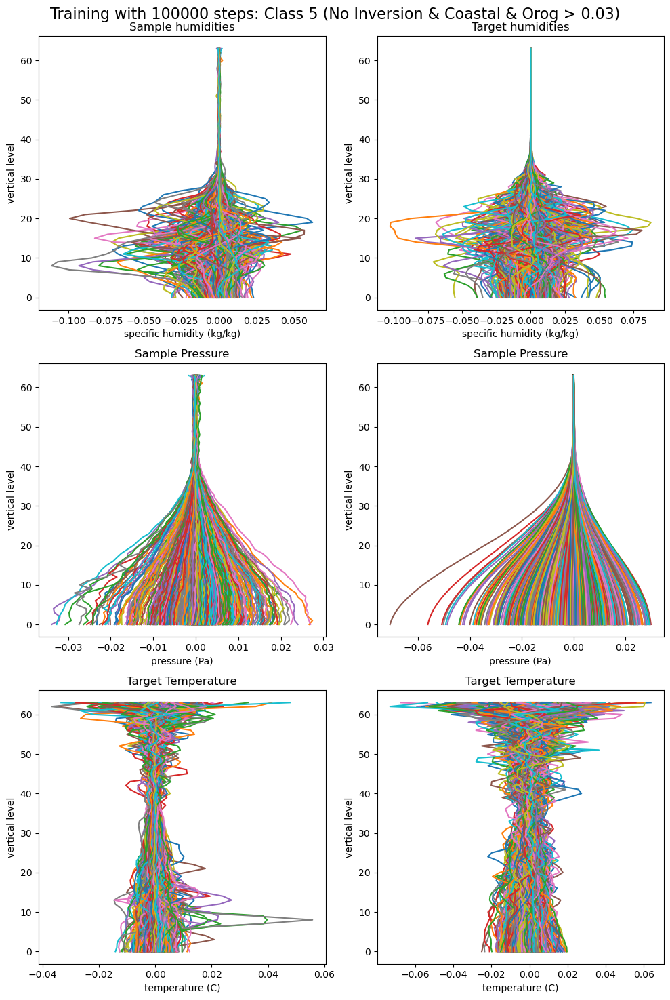

In [26]:

fig, axs = plt.subplots(3, 2, figsize=(10, 15))

#Sample humidities plot
sample_humidity = samples[4, :, 0, :] 
for i in range(1000):
    axs[0,0].plot(sample_humidity[i], np.arange(64))
axs[0,0].set_xlabel("specific humidity (kg/kg)")
axs[0,0].set_ylabel("vertical level")
axs[0,0].set_title("Sample humidities")


# Target humidities plot
target_humidity = trainingdata5[:, 0, :] 
for i in range(1000):
    axs[0,1].plot(target_humidity[i], np.arange(64))
axs[0,1].set_xlabel("specific humidity (kg/kg)")
axs[0,1].set_ylabel("vertical level")
axs[0,1].set_title("Target humidities")
#Sample pressure plot
sample_pressure = samples[4, :, 1, :]
for i in range(1000):
    axs[1,0].plot(sample_pressure[i], np.arange(64))
axs[1,0].set_xlabel("pressure (Pa)")
axs[1,0].set_ylabel("vertical level")
axs[1,0].set_title("Sample Pressure")

# Target pressure plot
target_pressure = trainingdata5[:, 1, :] 
for i in range(1000):
    axs[1,1].plot(target_pressure[i], np.arange(64))
axs[1,1].set_xlabel("pressure (Pa)")
axs[1,1].set_ylabel("vertical level")
axs[1,1].set_title("Sample Pressure")

#Sample temperature plot
sample_temperature = samples[4, :, 2, :]
for i in range(1000):
    axs[2,0].plot(sample_temperature[i], np.arange(64))
axs[2,0].set_xlabel("temperature (C)")
axs[2,0].set_ylabel("vertical level")
axs[2,0].set_title("Target Temperature")

# Target pressure plot
target_temperature = trainingdata5[:, 2, :]
for i in range(1000):
    axs[2,1].plot(target_temperature[i], np.arange(64))
axs[2,1].set_xlabel("temperature (C)")
axs[2,1].set_ylabel("vertical level")
axs[2,1].set_title("Target Temperature")

fig.suptitle("Training with 100000 steps: Class 5 (No Inversion & Coastal & Orog > 0.03)", fontsize = 16)

plt.tight_layout()
plt.show()

In [27]:
#humid
target_mean_1h = np.mean(training_data5[:,0,:], axis= 0)
sample_mean_1h = np.mean(sample_humidity, axis=0)
target_variance_1h= np.var(training_data5[:,0,:], axis= 0)
sample_variance_1h = np.var(sample_humidity, axis=0)

mse_mean_1h = mean_squared_error(target_mean_1h, sample_mean_1h)
mse_variance_1h = mean_squared_error(target_variance_1h, sample_variance_1h)

#press
target_mean_1p = np.mean(training_data5[:,1,:], axis= 0)
sample_mean_1p = np.mean(sample_pressure, axis=0)
target_variance_1p= np.var(training_data5[:,1,:], axis= 0)
sample_variance_1p = np.var(sample_pressure, axis=0)

mse_mean_1p = mean_squared_error(target_mean_1p, sample_mean_1p)
mse_variance_1p = mean_squared_error(target_variance_1p, sample_variance_1p)

#temp
target_mean_1t = np.mean(training_data5[:,2,:], axis= 0)
sample_mean_1t = np.mean(sample_pressure, axis=0)
target_variance_1t= np.var(training_data5[:,2,:], axis= 0)
sample_variance_1t = np.var(sample_pressure, axis=0)

mse_mean_1t = mean_squared_error(target_mean_1t, sample_mean_1t)
mse_variance_1t = mean_squared_error(target_variance_1t, sample_variance_1t)

#results
print('Results for Class 5 (No Inversion & Coastal & Orog > 0.03)')
print(f"Humidity, MSE Mean: {mse_mean_1h}, MSE Variance: {mse_variance_1h}, target_mean: {np.mean(target_mean_1h)} ")
print(f"Pressure, MSE Mean: {mse_mean_1p}, MSE Variance: {mse_variance_1p}, target_mean: {np.mean(target_mean_1p)} ")
print(f"Temperature, MSE Mean: {mse_mean_1t}, MSE Variance: {mse_variance_1t}, target_mean: {np.mean(target_mean_1t)} ")

Results for Class 5 (No Inversion & Coastal & Orog > 0.03)
Humidity, MSE Mean: 9.624304766475689e-07, MSE Variance: 8.924626038187e-10, target_mean: 0.00012497782881837338 
Pressure, MSE Mean: 8.127774719923764e-08, MSE Variance: 6.637422167443674e-09, target_mean: 0.00011096235539298505 
Temperature, MSE Mean: 1.90522897014489e-07, MSE Variance: 1.8177523930518191e-09, target_mean: 2.2992559024714865e-05 


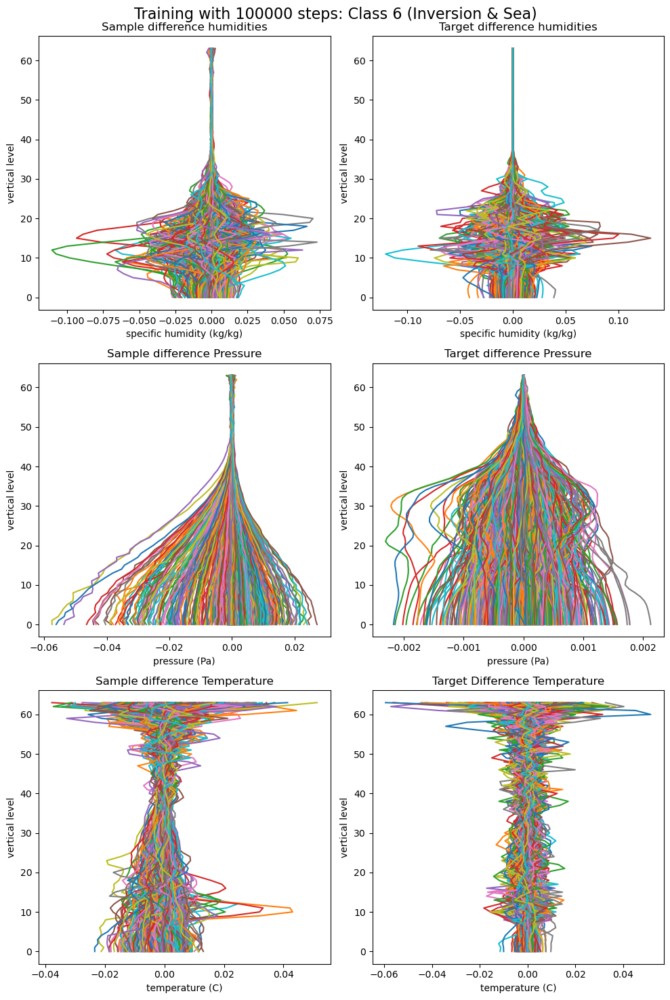

In [28]:
fig, axs = plt.subplots(3, 2, figsize=(10, 15))

#Sample humidities plot
sample_humidity = samples[5, :, 0, :]
for i in range(1000):
    axs[0,0].plot(sample_humidity[i], np.arange(64))
axs[0,0].set_xlabel("specific humidity (kg/kg)")
axs[0,0].set_ylabel("vertical level")
axs[0,0].set_title("Sample difference humidities")


# Target humidities plot
target_humidity = trainingdata6[:, 0, :] 
for i in range(1000):
    axs[0,1].plot(target_humidity[i], np.arange(64))
axs[0,1].set_xlabel("specific humidity (kg/kg)")
axs[0,1].set_ylabel("vertical level")
axs[0,1].set_title("Target difference humidities")

#Sample pressure plot
sample_pressure = samples[5, :, 1, :] 
for i in range(1000):
    axs[1,0].plot(sample_pressure[i], np.arange(64))
axs[1,0].set_xlabel("pressure (Pa)")
axs[1,0].set_ylabel("vertical level")
axs[1,0].set_title("Sample difference Pressure")

# Target pressure plot
target_pressure = trainingdata6[:, 1, :] 
for i in range(1000):
    axs[1,1].plot(target_pressure[i], np.arange(64))
axs[1,1].set_xlabel("pressure (Pa)")
axs[1,1].set_ylabel("vertical level")
axs[1,1].set_title("Target difference Pressure")

#Sample temperature plot
sample_temperature = samples[5, :, 2, :]
for i in range(1000):
    axs[2,0].plot(sample_temperature[i], np.arange(64))
axs[2,0].set_xlabel("temperature (C)")
axs[2,0].set_ylabel("vertical level")
axs[2,0].set_title("Sample difference Temperature")

# Target pressure plot
target_temperature = trainingdata6[:, 2, :]
for i in range(1000):
    axs[2,1].plot(target_temperature[i], np.arange(64))
axs[2,1].set_xlabel("temperature (C)")
axs[2,1].set_ylabel("vertical level")
axs[2,1].set_title("Target Difference Temperature")

fig.suptitle("Training with 100000 steps: Class 6 (Inversion & Sea)", fontsize = 16)

plt.tight_layout()
plt.show()

In [29]:
target_mean_1h = np.mean(training_data6[:,0,:], axis= 0)
sample_mean_1h = np.mean(sample_humidity, axis=0)
target_variance_1h= np.var(training_data6[:,0,:], axis= 0)
sample_variance_1h = np.var(sample_humidity, axis=0)

mse_mean_1h = mean_squared_error(target_mean_1h, sample_mean_1h)
mse_variance_1h = mean_squared_error(target_variance_1h, sample_variance_1h)

#pres
target_mean_1p = np.mean(training_data6[:,1,:], axis= 0)
sample_mean_1p = np.mean(sample_pressure, axis=0)
target_variance_1p= np.var(training_data6[:,1,:], axis= 0)
sample_variance_1p = np.var(sample_pressure, axis=0)

mse_mean_1p = mean_squared_error(target_mean_1p, sample_mean_1p)
mse_variance_1p = mean_squared_error(target_variance_1p, sample_variance_1p)

#temp
target_mean_1t = np.mean(training_data6[:,2,:], axis= 0)
sample_mean_1t = np.mean(sample_pressure, axis=0)
target_variance_1t= np.var(training_data6[:,2,:], axis= 0)
sample_variance_1t = np.var(sample_pressure, axis=0)

mse_mean_1t = mean_squared_error(target_mean_1t, sample_mean_1t)
mse_variance_1t = mean_squared_error(target_variance_1t, sample_variance_1t)

#results
print('Results for Class 6 (Inversion & Sea)')
print(f"Humidity, MSE Mean: {mse_mean_1h}, MSE Variance: {mse_variance_1h}, target_mean: {np.mean(target_mean_1h)} ")
print(f"Pressure, MSE Mean: {mse_mean_1p}, MSE Variance: {mse_variance_1p}, target_mean: {np.mean(target_mean_1p)} ")
print(f"Temperature, MSE Mean: {mse_mean_1t}, MSE Variance: {mse_variance_1t}, target_mean: {np.mean(target_mean_1t)} ")

Results for Class 6 (Inversion & Sea)
Humidity, MSE Mean: 1.7588789091860235e-07, MSE Variance: 8.666915796151642e-11, target_mean: -3.4910146496258676e-05 
Pressure, MSE Mean: 4.966988154109231e-09, MSE Variance: 1.6818334502843868e-09, target_mean: 1.3840792689734371e-06 
Temperature, MSE Mean: 4.521519159084164e-09, MSE Variance: 1.6683541215201103e-09, target_mean: -1.8906689547293354e-06 


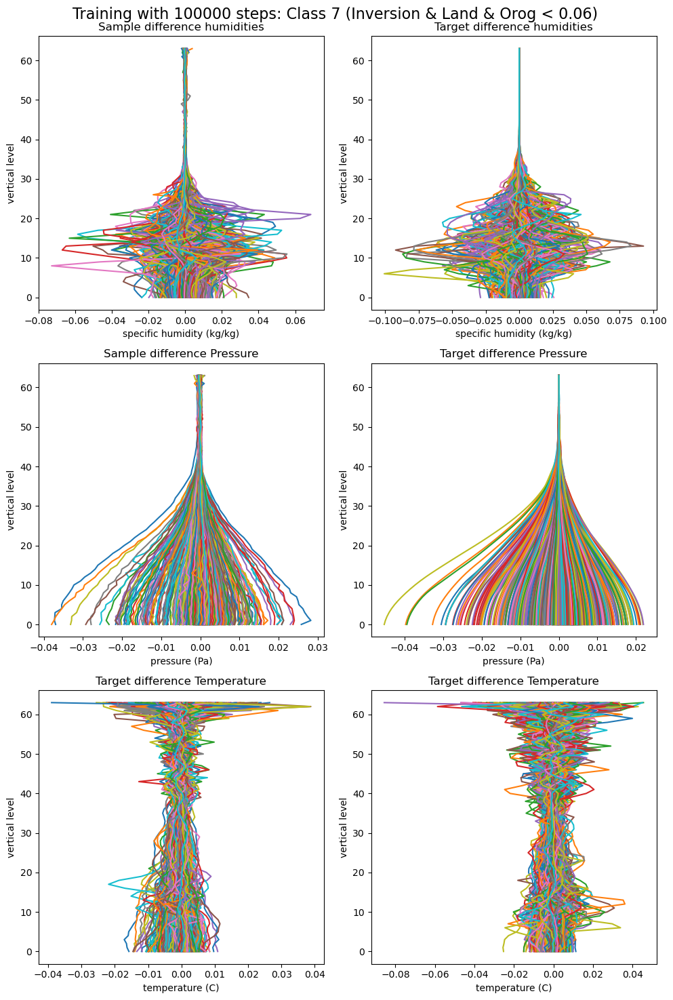

In [30]:
fig, axs = plt.subplots(3, 2, figsize=(10, 15))

#Sample humidities plot
sample_humidity = samples[6, :, 0, :]
for i in range(1000):
    axs[0,0].plot(sample_humidity[i], np.arange(64))
axs[0,0].set_xlabel("specific humidity (kg/kg)")
axs[0,0].set_ylabel("vertical level")
axs[0,0].set_title("Sample difference humidities")


# Target humidities plot
target_humidity = trainingdata7[:, 0, :] 
for i in range(1000):
    axs[0,1].plot(target_humidity[i], np.arange(64))
axs[0,1].set_xlabel("specific humidity (kg/kg)")
axs[0,1].set_ylabel("vertical level")
axs[0,1].set_title("Target difference humidities")

#Sample pressure plot
sample_pressure = samples[6, :, 1, :] 
for i in range(1000):
    axs[1,0].plot(sample_pressure[i], np.arange(64))
axs[1,0].set_xlabel("pressure (Pa)")
axs[1,0].set_ylabel("vertical level")
axs[1,0].set_title("Sample difference Pressure")

# Target pressure plot
target_pressure = trainingdata7[:, 1, :] 
for i in range(1000):
    axs[1,1].plot(target_pressure[i], np.arange(64))
axs[1,1].set_xlabel("pressure (Pa)")
axs[1,1].set_ylabel("vertical level")
axs[1,1].set_title("Target difference Pressure")

#Sample temperature plot
sample_temperature = samples[6, :, 2, :]
for i in range(1000):
    axs[2,0].plot(sample_temperature[i], np.arange(64))
axs[2,0].set_xlabel("temperature (C)")
axs[2,0].set_ylabel("vertical level")
axs[2,0].set_title("Target difference Temperature")

# Target pressure plot
target_temperature = trainingdata7[:, 2, :]
for i in range(1000):
    axs[2,1].plot(target_temperature[i], np.arange(64))
axs[2,1].set_xlabel("temperature (C)")
axs[2,1].set_ylabel("vertical level")
axs[2,1].set_title("Target difference Temperature")

fig.suptitle("Training with 100000 steps: Class 7 (Inversion & Land & Orog < 0.06)", fontsize = 16)

plt.tight_layout()
plt.show()

In [31]:
target_mean_1h = np.mean(training_data7[:,0,:], axis= 0)
sample_mean_1h = np.mean(sample_humidity, axis=0)
target_variance_1h= np.var(training_data7[:,0,:], axis= 0)
sample_variance_1h = np.var(sample_humidity, axis=0)

mse_mean_1h = mean_squared_error(target_mean_1h, sample_mean_1h)
mse_variance_1h = mean_squared_error(target_variance_1h, sample_variance_1h)

#press
target_mean_1p = np.mean(training_data7[:,1,:], axis= 0)
sample_mean_1p = np.mean(sample_pressure, axis=0)
target_variance_1p= np.var(training_data7[:,1,:], axis= 0)
sample_variance_1p = np.var(sample_pressure, axis=0)

mse_mean_1p = mean_squared_error(target_mean_1p, sample_mean_1p)
mse_variance_1p = mean_squared_error(target_variance_1p, sample_variance_1p)

#temp
target_mean_1t = np.mean(training_data7[:,2,:], axis= 0)
sample_mean_1t = np.mean(sample_pressure, axis=0)
target_variance_1t= np.var(training_data7[:,2,:], axis= 0)
sample_variance_1t = np.var(sample_pressure, axis=0)

mse_mean_1t = mean_squared_error(target_mean_1t, sample_mean_1t)
mse_variance_1t = mean_squared_error(target_variance_1t, sample_variance_1t)

#results
print('Results for Class 7 (Inversion & Land & Orog < 0.06)')
print(f"Humidity, MSE Mean: {mse_mean_1h}, MSE Variance: {mse_variance_1h}, target_mean: {np.mean(target_mean_1h)} ")
print(f"Pressure, MSE Mean: {mse_mean_1p}, MSE Variance: {mse_variance_1p}, target_mean: {np.mean(target_mean_1p)} ")
print(f"Temperature, MSE Mean: {mse_mean_1t}, MSE Variance: {mse_variance_1t}, target_mean: {np.mean(target_mean_1t)} ")

Results for Class 7 (Inversion & Land & Orog < 0.06)
Humidity, MSE Mean: 5.55938086677088e-08, MSE Variance: 1.639278490728202e-09, target_mean: -2.3349939510808326e-05 
Pressure, MSE Mean: 4.6608548132098804e-08, MSE Variance: 2.1611407108323988e-10, target_mean: 2.193442742282059e-05 
Temperature, MSE Mean: 5.447982331929779e-08, MSE Variance: 5.573572159356388e-10, target_mean: 1.0819177987286821e-05 


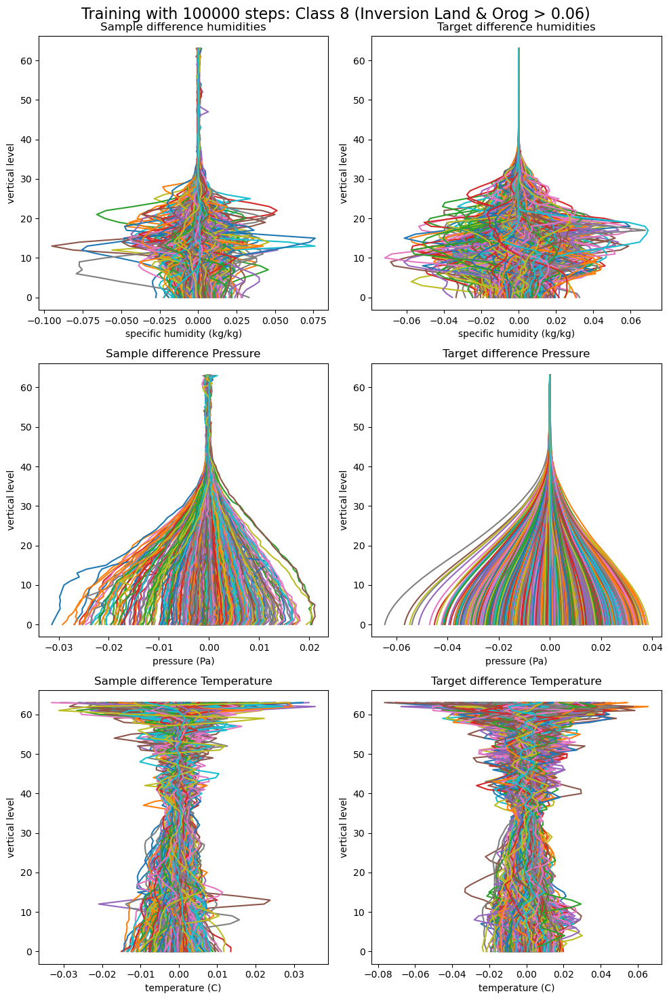

In [32]:
fig, axs = plt.subplots(3, 2, figsize=(10, 15))

#Sample humidities plot
sample_humidity = samples[7, :, 0, :] 
for i in range(1000):
    axs[0,0].plot(sample_humidity[i], np.arange(64))
axs[0,0].set_xlabel("specific humidity (kg/kg)")
axs[0,0].set_ylabel("vertical level")
axs[0,0].set_title("Sample difference humidities")


# Target humidities plot
target_humidity = trainingdata8[:, 0, :]
for i in range(1000):
    axs[0,1].plot(target_humidity[i], np.arange(64))
axs[0,1].set_xlabel("specific humidity (kg/kg)")
axs[0,1].set_ylabel("vertical level")
axs[0,1].set_title("Target difference humidities")

#Sample pressure plot
sample_pressure = samples[7, :, 1, :] 
for i in range(1000):
    axs[1,0].plot(sample_pressure[i], np.arange(64))
axs[1,0].set_xlabel("pressure (Pa)")
axs[1,0].set_ylabel("vertical level")
axs[1,0].set_title("Sample difference Pressure")

# Target pressure plot
target_pressure = trainingdata8[:, 1, :]
for i in range(1000):
    axs[1,1].plot(target_pressure[i], np.arange(64))
axs[1,1].set_xlabel("pressure (Pa)")
axs[1,1].set_ylabel("vertical level")
axs[1,1].set_title("Target difference Pressure")

#Sample temperature plot
sample_temperature = samples[7, :, 2, :]
for i in range(1000):
    axs[2,0].plot(sample_temperature[i], np.arange(64))
axs[2,0].set_xlabel("temperature (C)")
axs[2,0].set_ylabel("vertical level")
axs[2,0].set_title("Sample difference Temperature")

# Target pressure plot
target_temperature = trainingdata8[:, 2, :]
for i in range(1000):
    axs[2,1].plot(target_temperature[i], np.arange(64))
axs[2,1].set_xlabel("temperature (C)")
axs[2,1].set_ylabel("vertical level")
axs[2,1].set_title("Target difference Temperature")

fig.suptitle("Training with 100000 steps: Class 8 (Inversion Land & Orog > 0.06)", fontsize = 16)

plt.tight_layout()
plt.show()

In [33]:
target_mean_1h = np.mean(training_data8[:,0,:], axis= 0)
sample_mean_1h = np.mean(sample_humidity, axis=0)
target_variance_1h= np.var(training_data8[:,0,:], axis= 0)
sample_variance_1h = np.var(sample_humidity, axis=0)

mse_mean_1h = mean_squared_error(target_mean_1h, sample_mean_1h)
mse_variance_1h = mean_squared_error(target_variance_1h, sample_variance_1h)

#press
target_mean_1p = np.mean(training_data8[:,1,:], axis= 0)
sample_mean_1p = np.mean(sample_pressure, axis=0)
target_variance_1p= np.var(training_data8[:,1,:], axis= 0)
sample_variance_1p = np.var(sample_pressure, axis=0)

mse_mean_1p = mean_squared_error(target_mean_1p, sample_mean_1p)
mse_variance_1p = mean_squared_error(target_variance_1p, sample_variance_1p)

#temp
target_mean_1t = np.mean(training_data8[:,2,:], axis= 0)
sample_mean_1t = np.mean(sample_pressure, axis=0)
target_variance_1t= np.var(training_data8[:,2,:], axis= 0)
sample_variance_1t = np.var(sample_pressure, axis=0)

mse_mean_1t = mean_squared_error(target_mean_1t, sample_mean_1t)
mse_variance_1t = mean_squared_error(target_variance_1t, sample_variance_1t)

#results
print('Results for Class 8 (Inversion Land & Orog > 0.06)')
print(f"Humidity, MSE Mean: {mse_mean_1h}, MSE Variance: {mse_variance_1h}, target_mean: {np.mean(target_mean_1h)} ")
print(f"Pressure, MSE Mean: {mse_mean_1p}, MSE Variance: {mse_variance_1p}, target_mean: {np.mean(target_mean_1p)} ")
print(f"Temperature, MSE Mean: {mse_mean_1t}, MSE Variance: {mse_variance_1t}, target_mean: {np.mean(target_mean_1t)} ")

Results for Class 8 (Inversion Land & Orog > 0.06)
Humidity, MSE Mean: 1.196604699771342e-07, MSE Variance: 2.2356774209697505e-09, target_mean: -1.7684495105640963e-05 
Pressure, MSE Mean: 7.2786274785130445e-09, MSE Variance: 1.2621039324756111e-08, target_mean: -1.56006972247269e-05 
Temperature, MSE Mean: 1.3455395020400829e-08, MSE Variance: 2.9052520389427627e-09, target_mean: 3.381822352821473e-06 


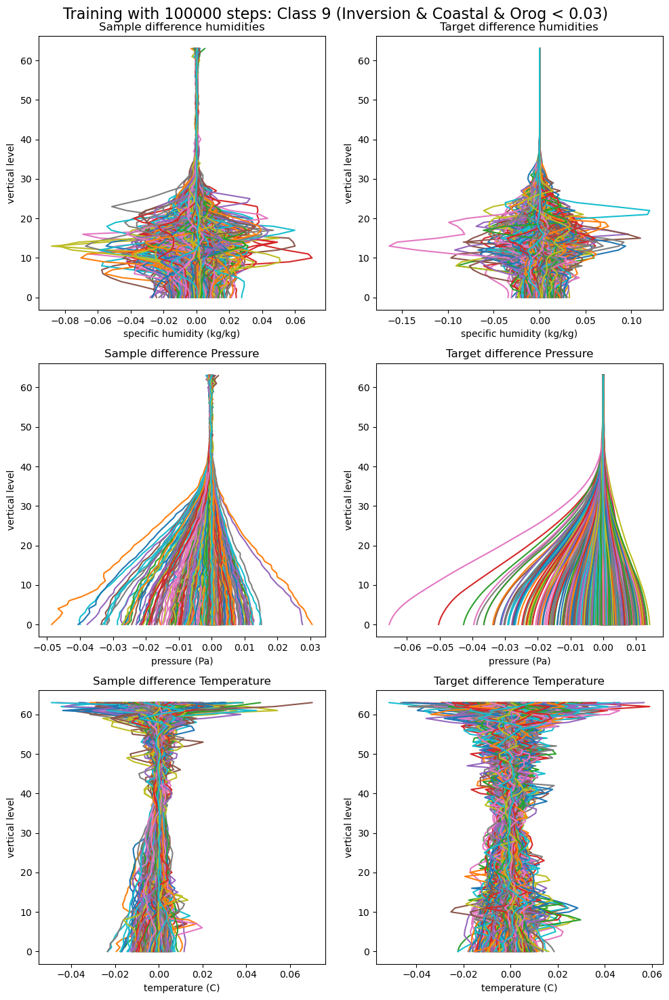

In [34]:
fig, axs = plt.subplots(3, 2, figsize=(10, 15))

#Sample humidities plot
sample_humidity = samples[8, :, 0, :] 
for i in range(1000):
    axs[0,0].plot(sample_humidity[i], np.arange(64))
axs[0,0].set_xlabel("specific humidity (kg/kg)")
axs[0,0].set_ylabel("vertical level")
axs[0,0].set_title("Sample difference humidities")


# Target humidities plot
target_humidity = trainingdata9[:, 0, :] 
for i in range(1000):
    axs[0,1].plot(target_humidity[i], np.arange(64))
axs[0,1].set_xlabel("specific humidity (kg/kg)")
axs[0,1].set_ylabel("vertical level")
axs[0,1].set_title("Target difference humidities")

#Sample pressure plot
sample_pressure = samples[8, :, 1, :]
for i in range(1000):
    axs[1,0].plot(sample_pressure[i], np.arange(64))
axs[1,0].set_xlabel("pressure (Pa)")
axs[1,0].set_ylabel("vertical level")
axs[1,0].set_title("Sample difference Pressure")

# Target pressure plot
target_pressure = trainingdata9[:, 1, :] 
for i in range(1000):
    axs[1,1].plot(target_pressure[i], np.arange(64))
axs[1,1].set_xlabel("pressure (Pa)")
axs[1,1].set_ylabel("vertical level")
axs[1,1].set_title("Target difference Pressure")

#Sample temperature plot
sample_temperature = samples[8, :, 2, :]
for i in range(1000):
    axs[2,0].plot(sample_temperature[i], np.arange(64))
axs[2,0].set_xlabel("temperature (C)")
axs[2,0].set_ylabel("vertical level")
axs[2,0].set_title("Sample difference Temperature")

# Target pressure plot
target_temperature = trainingdata9[:, 2, :]
for i in range(1000):
    axs[2,1].plot(target_temperature[i], np.arange(64))
axs[2,1].set_xlabel("temperature (C)")
axs[2,1].set_ylabel("vertical level")
axs[2,1].set_title("Target difference Temperature")

fig.suptitle("Training with 100000 steps: Class 9 (Inversion & Coastal & Orog < 0.03)", fontsize = 16)

plt.tight_layout()
plt.show()

In [35]:
target_mean_1h = np.mean(training_data9[:,0,:], axis= 0)
sample_mean_1h = np.mean(sample_humidity, axis=0)
target_variance_1h= np.var(training_data9[:,0,:], axis= 0)
sample_variance_1h = np.var(sample_humidity, axis=0)

mse_mean_1h = mean_squared_error(target_mean_1h, sample_mean_1h)
mse_variance_1h = mean_squared_error(target_variance_1h, sample_variance_1h)

#press
target_mean_1p = np.mean(training_data9[:,1,:], axis= 0)
sample_mean_1p = np.mean(sample_pressure, axis=0)
target_variance_1p= np.var(training_data9[:,1,:], axis= 0)
sample_variance_1p = np.var(sample_pressure, axis=0)

mse_mean_1p = mean_squared_error(target_mean_1p, sample_mean_1p)
mse_variance_1p = mean_squared_error(target_variance_1p, sample_variance_1p)

#temp
target_mean_1t = np.mean(training_data9[:,2,:], axis= 0)
sample_mean_1t = np.mean(sample_pressure, axis=0)
target_variance_1t= np.var(training_data9[:,2,:], axis= 0)
sample_variance_1t = np.var(sample_pressure, axis=0)

mse_mean_1t = mean_squared_error(target_mean_1t, sample_mean_1t)
mse_variance_1t = mean_squared_error(target_variance_1t, sample_variance_1t)

#results
print('Results for Class 9 (Inversion & Coastal & Orog < 0.03)')
print(f"Humidity, MSE Mean: {mse_mean_1h}, MSE Variance: {mse_variance_1h}, target_mean: {np.mean(target_mean_1h)} ")
print(f"Pressure, MSE Mean: {mse_mean_1p}, MSE Variance: {mse_variance_1p}, target_mean: {np.mean(target_mean_1p)} ")
print(f"Temperature, MSE Mean: {mse_mean_1t}, MSE Variance: {mse_variance_1t}, target_mean: {np.mean(target_mean_1t)} ")

Results for Class 9 (Inversion & Coastal & Orog < 0.03)
Humidity, MSE Mean: 7.99071102619564e-08, MSE Variance: 1.1778391595385074e-09, target_mean: -4.263206210453063e-05 
Pressure, MSE Mean: 1.6901609001251927e-07, MSE Variance: 1.2127696069619276e-10, target_mean: -4.602248372975737e-05 
Temperature, MSE Mean: 2.0194995897782064e-07, MSE Variance: 5.767293864700207e-10, target_mean: -1.760683153406717e-05 


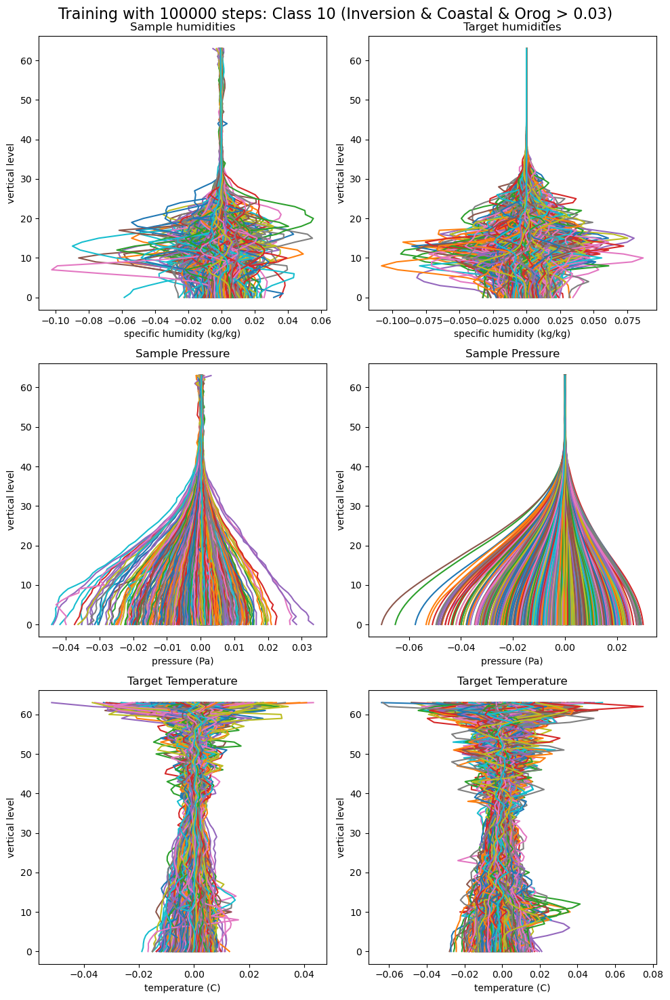

In [36]:
fig, axs = plt.subplots(3, 2, figsize=(10, 15))

#Sample humidities plot
sample_humidity = samples[9, :, 0, :] 
for i in range(1000):
    axs[0,0].plot(sample_humidity[i], np.arange(64))
axs[0,0].set_xlabel("specific humidity (kg/kg)")
axs[0,0].set_ylabel("vertical level")
axs[0,0].set_title("Sample humidities")


# Target humidities plot
target_humidity = trainingdata10[:, 0, :] 
for i in range(1000):
    axs[0,1].plot(target_humidity[i], np.arange(64))
axs[0,1].set_xlabel("specific humidity (kg/kg)")
axs[0,1].set_ylabel("vertical level")
axs[0,1].set_title("Target humidities")
#Sample pressure plot
sample_pressure = samples[9, :, 1, :]
for i in range(1000):
    axs[1,0].plot(sample_pressure[i], np.arange(64))
axs[1,0].set_xlabel("pressure (Pa)")
axs[1,0].set_ylabel("vertical level")
axs[1,0].set_title("Sample Pressure")

# Target pressure plot
target_pressure = trainingdata10[:, 1, :] 
for i in range(1000):
    axs[1,1].plot(target_pressure[i], np.arange(64))
axs[1,1].set_xlabel("pressure (Pa)")
axs[1,1].set_ylabel("vertical level")
axs[1,1].set_title("Sample Pressure")

#Sample temperature plot
sample_temperature = samples[9, :, 2, :]
for i in range(1000):
    axs[2,0].plot(sample_temperature[i], np.arange(64))
axs[2,0].set_xlabel("temperature (C)")
axs[2,0].set_ylabel("vertical level")
axs[2,0].set_title("Target Temperature")

# Target pressure plot
target_temperature = trainingdata10[:, 2, :]
for i in range(1000):
    axs[2,1].plot(target_temperature[i], np.arange(64))
axs[2,1].set_xlabel("temperature (C)")
axs[2,1].set_ylabel("vertical level")
axs[2,1].set_title("Target Temperature")

fig.suptitle("Training with 100000 steps: Class 10 (Inversion & Coastal & Orog > 0.03)", fontsize = 16)

plt.tight_layout()
plt.show()

In [37]:
target_mean_1h = np.mean(training_data10[:,0,:], axis= 0)
sample_mean_1h = np.mean(sample_humidity, axis=0)
target_variance_1h= np.var(training_data10[:,0,:], axis= 0)
sample_variance_1h = np.var(sample_humidity, axis=0)

mse_mean_1h = mean_squared_error(target_mean_1h, sample_mean_1h)
mse_variance_1h = mean_squared_error(target_variance_1h, sample_variance_1h)

#press
target_mean_1p = np.mean(training_data10[:,1,:], axis= 0)
sample_mean_1p = np.mean(sample_pressure, axis=0)
target_variance_1p= np.var(training_data10[:,1,:], axis= 0)
sample_variance_1p = np.var(sample_pressure, axis=0)

mse_mean_1p = mean_squared_error(target_mean_1p, sample_mean_1p)
mse_variance_1p = mean_squared_error(target_variance_1p, sample_variance_1p)

#temp
target_mean_1t = np.mean(training_data10[:,2,:], axis= 0)
sample_mean_1t = np.mean(sample_pressure, axis=0)
target_variance_1t= np.var(training_data10[:,2,:], axis= 0)
sample_variance_1t = np.var(sample_pressure, axis=0)

mse_mean_1t = mean_squared_error(target_mean_1t, sample_mean_1t)
mse_variance_1t = mean_squared_error(target_variance_1t, sample_variance_1t)

#results
print('Results for Class 10 (Inversion & Coastal & Orog > 0.03)')
print(f"Humidity, MSE Mean: {mse_mean_1h}, MSE Variance: {mse_variance_1h}, target_mean: {np.mean(target_mean_1h)} ")
print(f"Pressure, MSE Mean: {mse_mean_1p}, MSE Variance: {mse_variance_1p}, target_mean: {np.mean(target_mean_1p)} ")
print(f"Temperature, MSE Mean: {mse_mean_1t}, MSE Variance: {mse_variance_1t}, target_mean: {np.mean(target_mean_1t)} ")

Results for Class 10 (Inversion & Coastal & Orog > 0.03)
Humidity, MSE Mean: 2.4934692532951885e-07, MSE Variance: 4.2168757374838606e-09, target_mean: -4.584983616950922e-05 
Pressure, MSE Mean: 5.345873788087374e-08, MSE Variance: 5.660565349785429e-09, target_mean: -3.0918759875930846e-05 
Temperature, MSE Mean: 7.222111264582054e-08, MSE Variance: 1.258402271275827e-09, target_mean: -3.510645001369994e-06 


In [38]:
sample_diff_dir = Path("Samples_cond_diffs_5")
files_sample_diff = list(sample_diff_dir.iterdir())

sample_diffs = np.load(files_sample_diff[0]).squeeze()
sample_diffs.shape

(10, 1000, 3, 64)

In [39]:
samples = denormalise(sample_diffs, min_val, max_val)

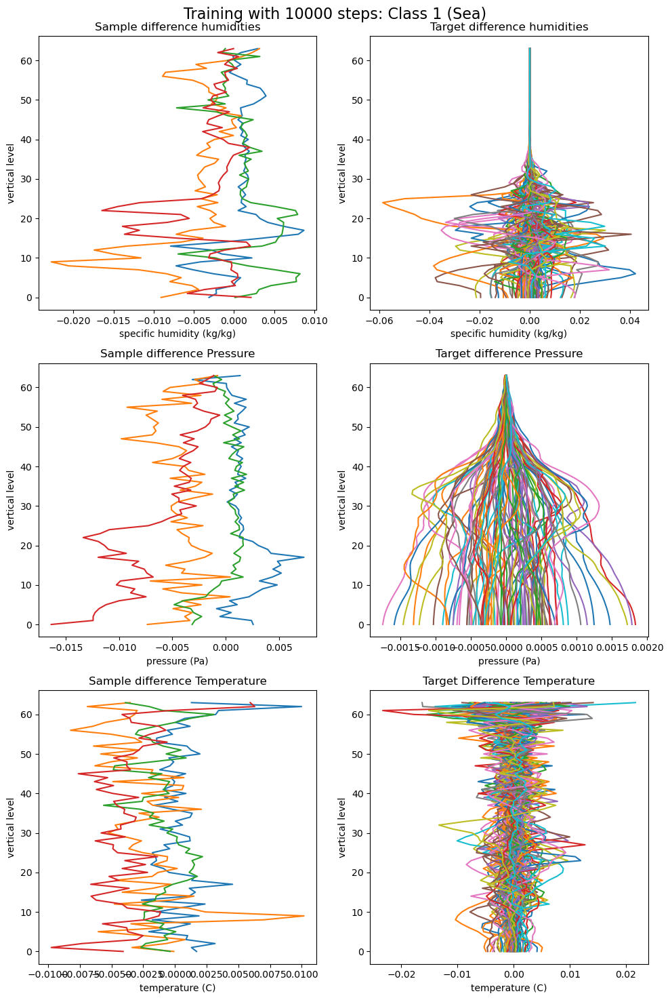

In [40]:
fig, axs = plt.subplots(3, 2, figsize=(10, 15))

#Sample humidities plot
sample_humidity = samples[0, :, 0, :]
for i in range(4):
    axs[0,0].plot(sample_humidity[i], np.arange(64))
axs[0,0].set_xlabel("specific humidity (kg/kg)")
axs[0,0].set_ylabel("vertical level")
axs[0,0].set_title("Sample difference humidities")


# Target humidities plot
target_humidity = trainingdata1[:144, 0, :] 
for i in range(100):
    axs[0,1].plot(target_humidity[i], np.arange(64))
axs[0,1].set_xlabel("specific humidity (kg/kg)")
axs[0,1].set_ylabel("vertical level")
axs[0,1].set_title("Target difference humidities")

#Sample pressure plot
sample_pressure = samples[0, :, 1, :] 
for i in range(4):
    axs[1,0].plot(sample_pressure[i], np.arange(64))
axs[1,0].set_xlabel("pressure (Pa)")
axs[1,0].set_ylabel("vertical level")
axs[1,0].set_title("Sample difference Pressure")

# Target pressure plot
target_pressure = trainingdata1[:144, 1, :] 
for i in range(100):
    axs[1,1].plot(target_pressure[i], np.arange(64))
axs[1,1].set_xlabel("pressure (Pa)")
axs[1,1].set_ylabel("vertical level")
axs[1,1].set_title("Target difference Pressure")

#Sample temperature plot
sample_temperature = samples[0, :, 2, :]
for i in range(4):
    axs[2,0].plot(sample_temperature[i], np.arange(64))
axs[2,0].set_xlabel("temperature (C)")
axs[2,0].set_ylabel("vertical level")
axs[2,0].set_title("Sample difference Temperature")

# Target pressure plot
target_temperature = trainingdata1[:144, 2, :]
for i in range(100):
    axs[2,1].plot(target_temperature[i], np.arange(64))
axs[2,1].set_xlabel("temperature (C)")
axs[2,1].set_ylabel("vertical level")
axs[2,1].set_title("Target Difference Temperature")

fig.suptitle("Training with 10000 steps: Class 1 (Sea)", fontsize = 16)

plt.tight_layout()
plt.show()

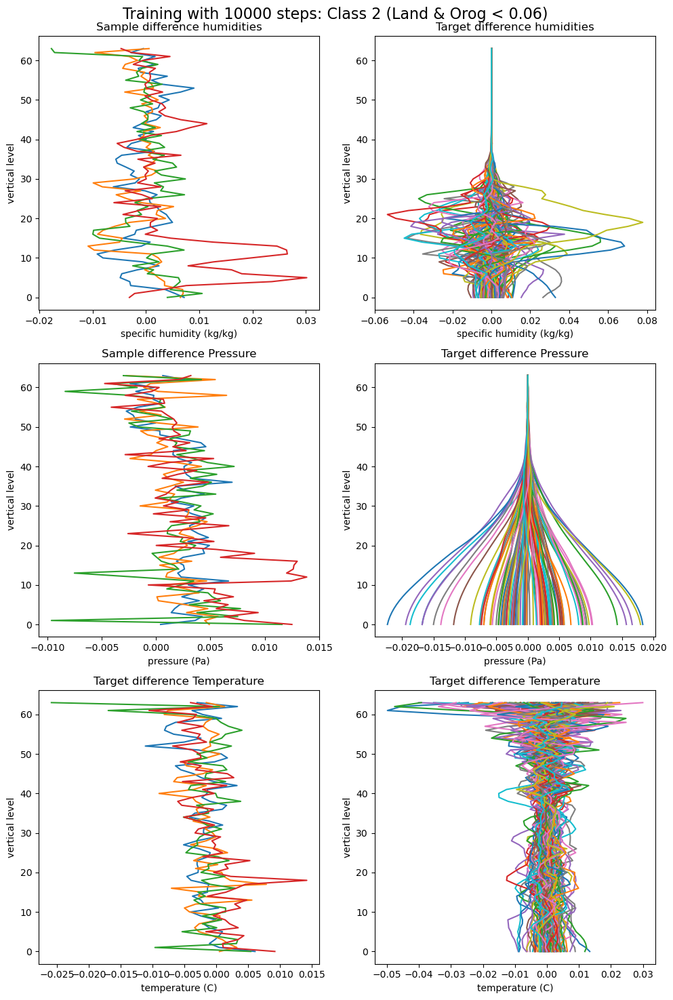

In [41]:

fig, axs = plt.subplots(3, 2, figsize=(10, 15))

#Sample humidities plot
sample_humidity = samples[1, :, 0, :]
for i in range(4):
    axs[0,0].plot(sample_humidity[i], np.arange(64))
axs[0,0].set_xlabel("specific humidity (kg/kg)")
axs[0,0].set_ylabel("vertical level")
axs[0,0].set_title("Sample difference humidities")


# Target humidities plot
target_humidity = trainingdata2[:144, 0, :] 
for i in range(100):
    axs[0,1].plot(target_humidity[i], np.arange(64))
axs[0,1].set_xlabel("specific humidity (kg/kg)")
axs[0,1].set_ylabel("vertical level")
axs[0,1].set_title("Target difference humidities")

#Sample pressure plot
sample_pressure = samples[1, :, 1, :] 
for i in range(4):
    axs[1,0].plot(sample_pressure[i], np.arange(64))
axs[1,0].set_xlabel("pressure (Pa)")
axs[1,0].set_ylabel("vertical level")
axs[1,0].set_title("Sample difference Pressure")

# Target pressure plot
target_pressure = trainingdata2[:144, 1, :] 
for i in range(100):
    axs[1,1].plot(target_pressure[i], np.arange(64))
axs[1,1].set_xlabel("pressure (Pa)")
axs[1,1].set_ylabel("vertical level")
axs[1,1].set_title("Target difference Pressure")

#Sample temperature plot
sample_temperature = samples[1, :, 2, :]
for i in range(4):
    axs[2,0].plot(sample_temperature[i], np.arange(64))
axs[2,0].set_xlabel("temperature (C)")
axs[2,0].set_ylabel("vertical level")
axs[2,0].set_title("Target difference Temperature")

# Target pressure plot
target_temperature = trainingdata2[:144, 2, :]
for i in range(100):
    axs[2,1].plot(target_temperature[i], np.arange(64))
axs[2,1].set_xlabel("temperature (C)")
axs[2,1].set_ylabel("vertical level")
axs[2,1].set_title("Target difference Temperature")

fig.suptitle("Training with 10000 steps: Class 2 (Land & Orog < 0.06)", fontsize = 16)

plt.tight_layout()
plt.show()

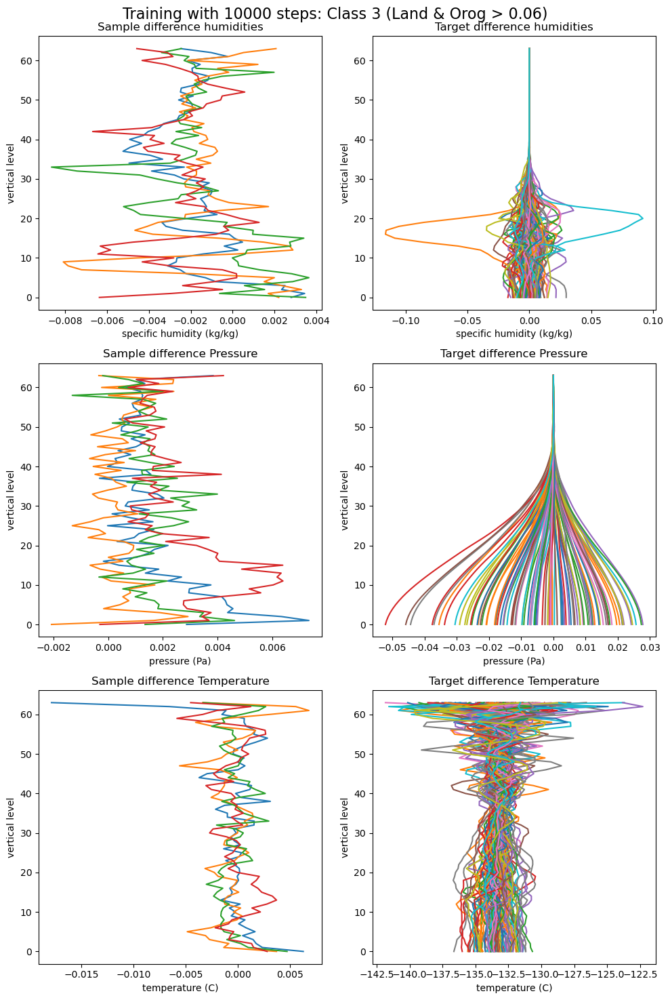

In [42]:
fig, axs = plt.subplots(3, 2, figsize=(10, 15))

#Sample humidities plot
sample_humidity = samples[2, :, 0, :] 
for i in range(4):
    axs[0,0].plot(sample_humidity[i], np.arange(64))
axs[0,0].set_xlabel("specific humidity (kg/kg)")
axs[0,0].set_ylabel("vertical level")
axs[0,0].set_title("Sample difference humidities")


# Target humidities plot
target_humidity = trainingdata3[:144, 0, :]
for i in range(100):
    axs[0,1].plot(target_humidity[i], np.arange(64))
axs[0,1].set_xlabel("specific humidity (kg/kg)")
axs[0,1].set_ylabel("vertical level")
axs[0,1].set_title("Target difference humidities")

#Sample pressure plot
sample_pressure = samples[2, :, 1, :] 
for i in range(4):
    axs[1,0].plot(sample_pressure[i], np.arange(64))
axs[1,0].set_xlabel("pressure (Pa)")
axs[1,0].set_ylabel("vertical level")
axs[1,0].set_title("Sample difference Pressure")

# Target pressure plot
target_pressure = trainingdata3[:144, 1, :]
for i in range(100):
    axs[1,1].plot(target_pressure[i], np.arange(64))
axs[1,1].set_xlabel("pressure (Pa)")
axs[1,1].set_ylabel("vertical level")
axs[1,1].set_title("Target difference Pressure")

#Sample temperature plot
sample_temperature = samples[2, :, 2, :]
for i in range(4):
    axs[2,0].plot(sample_temperature[i], np.arange(64))
axs[2,0].set_xlabel("temperature (C)")
axs[2,0].set_ylabel("vertical level")
axs[2,0].set_title("Sample difference Temperature")

# Target pressure plot
target_temperature = trainingdata3[:144, 2, :]* 180 + 140 -273.15
for i in range(100):
    axs[2,1].plot(target_temperature[i], np.arange(64))
axs[2,1].set_xlabel("temperature (C)")
axs[2,1].set_ylabel("vertical level")
axs[2,1].set_title("Target difference Temperature")

fig.suptitle("Training with 10000 steps: Class 3 (Land & Orog > 0.06)", fontsize = 16)

plt.tight_layout()
plt.show()

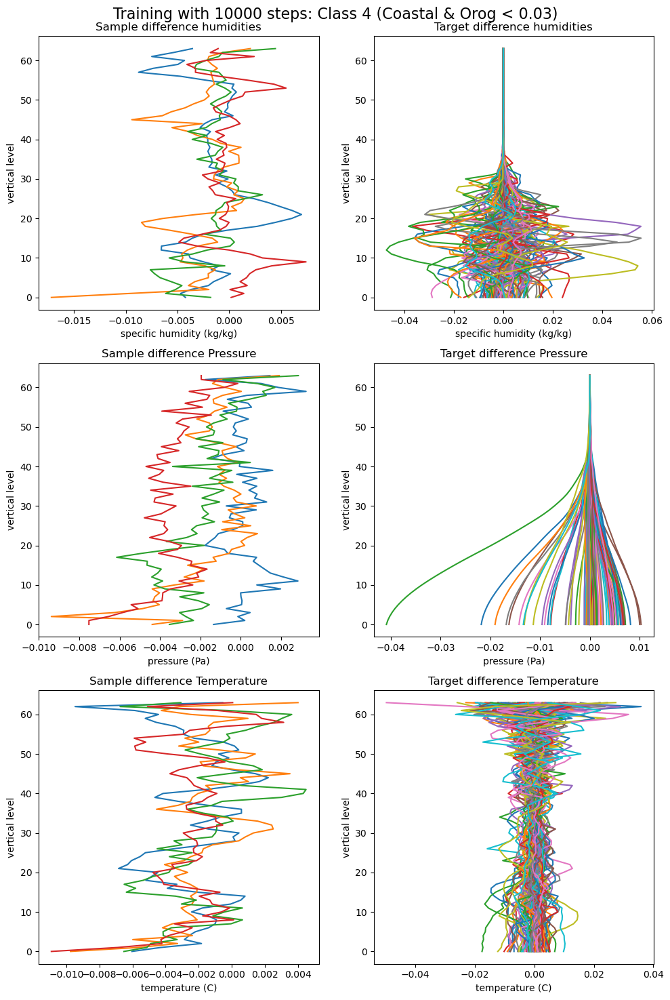

In [43]:
fig, axs = plt.subplots(3, 2, figsize=(10, 15))

#Sample humidities plot
sample_humidity = samples[3, :, 0, :] 
for i in range(4):
    axs[0,0].plot(sample_humidity[i], np.arange(64))
axs[0,0].set_xlabel("specific humidity (kg/kg)")
axs[0,0].set_ylabel("vertical level")
axs[0,0].set_title("Sample difference humidities")


# Target humidities plot
target_humidity = trainingdata4[:144, 0, :] 
for i in range(100):
    axs[0,1].plot(target_humidity[i], np.arange(64))
axs[0,1].set_xlabel("specific humidity (kg/kg)")
axs[0,1].set_ylabel("vertical level")
axs[0,1].set_title("Target difference humidities")

#Sample pressure plot
sample_pressure = samples[3, :, 1, :]
for i in range(4):
    axs[1,0].plot(sample_pressure[i], np.arange(64))
axs[1,0].set_xlabel("pressure (Pa)")
axs[1,0].set_ylabel("vertical level")
axs[1,0].set_title("Sample difference Pressure")

# Target pressure plot
target_pressure = trainingdata4[:144, 1, :] 
for i in range(100):
    axs[1,1].plot(target_pressure[i], np.arange(64))
axs[1,1].set_xlabel("pressure (Pa)")
axs[1,1].set_ylabel("vertical level")
axs[1,1].set_title("Target difference Pressure")

#Sample temperature plot
sample_temperature = samples[3, :, 2, :]
for i in range(4):
    axs[2,0].plot(sample_temperature[i], np.arange(64))
axs[2,0].set_xlabel("temperature (C)")
axs[2,0].set_ylabel("vertical level")
axs[2,0].set_title("Sample difference Temperature")

# Target pressure plot
target_temperature = trainingdata4[:144, 2, :]
for i in range(100):
    axs[2,1].plot(target_temperature[i], np.arange(64))
axs[2,1].set_xlabel("temperature (C)")
axs[2,1].set_ylabel("vertical level")
axs[2,1].set_title("Target difference Temperature")

fig.suptitle("Training with 10000 steps: Class 4 (Coastal & Orog < 0.03)", fontsize = 16)

plt.tight_layout()
plt.show()

In [44]:
sample_diff_dir = Path("Samples_cond_diffs_3")
files_sample_diff = list(sample_diff_dir.iterdir())

sample_diffs = np.load(files_sample_diff[0]).squeeze()
sample_diffs.shape

(5, 1000, 3, 64)

In [45]:
def denormalise(normalised_vector, min_val, max_val):
    original_vector = normalised_vector * (max_val - min_val) + min_val
    return original_vector

samples = denormalise(sample_diffs, min_val, max_val)